# A simple example of pseudo-spectral code

The KdV equation is

\begin{equation}
        \tag{1}
    \partial_t u + \tfrac{1}{2} u \partial_x u + \tfrac{1}{2}\partial_{xxx} u = 0\,.
\end{equation}

The exact solutions to this equation are the celebrated solitary waves of amplitude $a$

\begin{equation}
\tag{2}
u = a^2\,\text{sech}\,\left(\tfrac{1}{2}a\,x\right)\,.
\end{equation}

In [153]:
import numpy as np
from numpy import pi, sqrt, cos, sin, cosh
import matplotlib.pyplot as plt

%matplotlib inline

def sech(x):
    return 1./cosh(x)

In [154]:
N = 1024
L = 2.*pi
dx = L/N
nu = 0.
x = np.arange(0.,L,dx)

# An initial value problem

Consider two solitary waves (2) as initial conditions:

\begin{equation}
\tag{3}
u(x,t=0) = 3 a_1^2\,\text{sech}\,\left[\tfrac{1}{2}a_1(x-1)\right] +  3 a_2^2\,\text{sech}\,\left[\tfrac{1}{2}a_2(x-2)\right]\,,
\end{equation}

where the amplitudes of these two two solitary waves are $a_1 = 25$ and $a_2 = 16$. We solve (1) subjecto the initial condition (3) using a dealiased  pseudo-spectral method, marching forward with a RK3W-$\theta$ scheme.

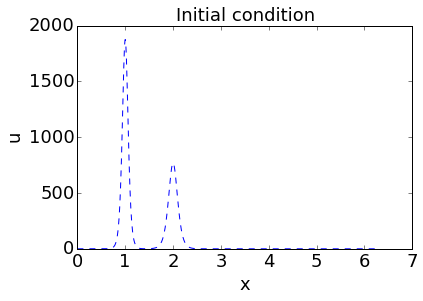

In [155]:
a1 = 25.
a2 = 16.
u0 = 3*a1**2*sech(.5*(a1*(x-1.)))**2 + 3*a2**2*sech(.5*(a2*(x-2)))**2 
k = np.arange(0.,N/2+1)

plt.plot(x,u0,'--')
plt.xlabel("x")
plt.ylabel("u")
plt.title("Initial condition")

What you think it is going to happen? Hint: the propagation speed depends on the amplitute.

In [156]:
Lin = dt*(-nu*k**2 + 0.5*1j*(k**3))   # linear operator

def NL(k,uh,N):
    """ Compute dealiased nonlinear term of KdV eqn """
    
    uh_pad = np.zeros(3*N/4+1,dtype='complex128')
    uxh_pad = np.zeros(3*N/4+1,dtype='complex128')

    uh_pad[:N/2+1] = uh
    uxh_pad[:N/2+1] = 1j*k*uh

    u_pad = np.fft.irfft(uh_pad)
    ux_pad = np.fft.irfft(uxh_pad)           

    return -.5*np.fft.rfft(u_pad*ux_pad)[:N/2+1]

In [157]:
def stepforward(k,uh,N,dt,Lin,NL):
    """ Step the KdV equation forwards using a RK3W-theta scheme:
            implicit for linear viscous term and explicit for NL term """
    a1, a2, a3 = 29./96., -3./40., 1./6.
    b1, b2, b3 = 37./160., 5./24., 1./6.
    c1, c2, c3 = 8./15., 5./12., 3./4.
    d1, d2 = -17./60., 5./12.
    
    NL1 = NL(k,uh,N)
    uh = ( (1. + a1*Lin)/(1. - b1*Lin) )*uh + c1*dt*NL1
    
    NL2 = NL1.copy()
    NL1 = NL(k,uh,N)
    uh = ( (1. + a2*Lin)/(1. - b2*Lin) )*uh + c2*dt*NL1 + d1*dt*NL2

    NL2 = NL1.copy()
    NL1 = NL(k,uh,N)
    uh = ( (1. + a3*Lin)/(1. - b3*Lin) )*uh + c3*dt*NL1 + d2*dt*NL2

    return uh

In [158]:
dt = .1*dx/u0.max()
tmax = 0.01
nmax = int(np.ceil(tmax/dt))

dsave = 50
nsave = int(nmax/50)+1
usave = np.empty((nsave,u0.size))
t = np.empty(nsave)

In [159]:
uh = np.fft.rfft(u0)
ksave = 0
for i in range(nmax):
    uh = stepforward(k,uh,N,dt,Lin,NL)
    if not (i%50):
        usave[ksave,:] = np.fft.irfft(uh)
        t[ksave] = (i+1)*dt
        ksave += 1

In [160]:
from JSAnimation.IPython_display import display_animation
from matplotlib import animation


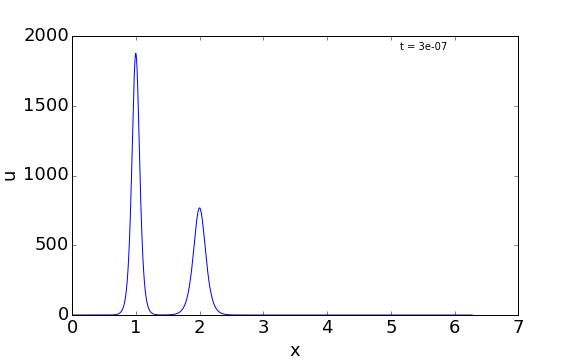
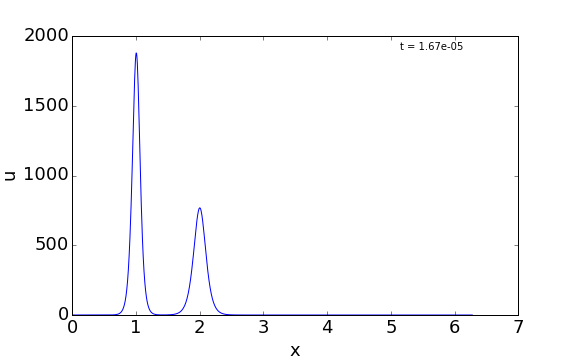
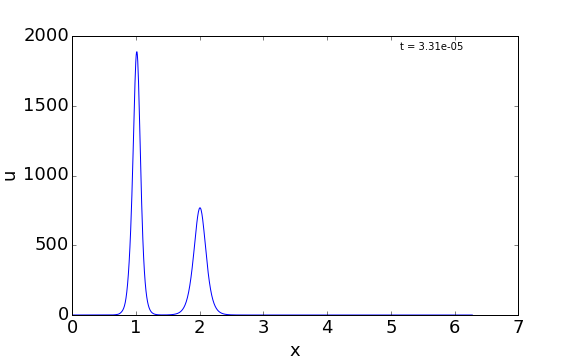
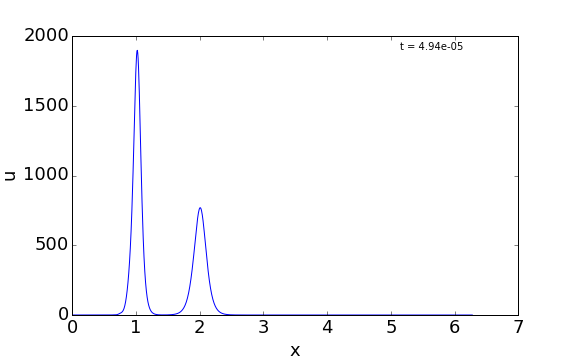
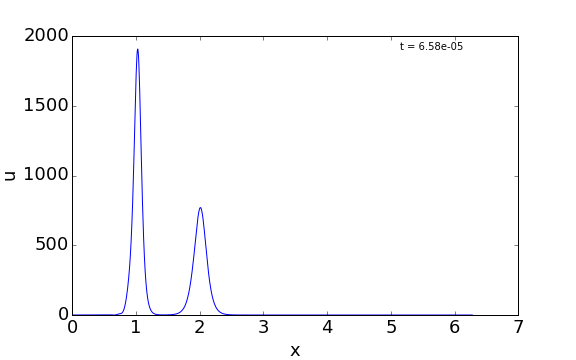
...
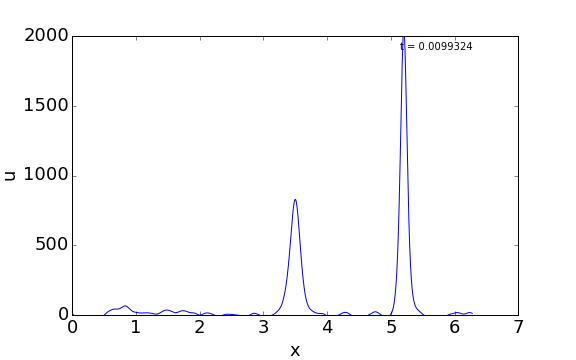
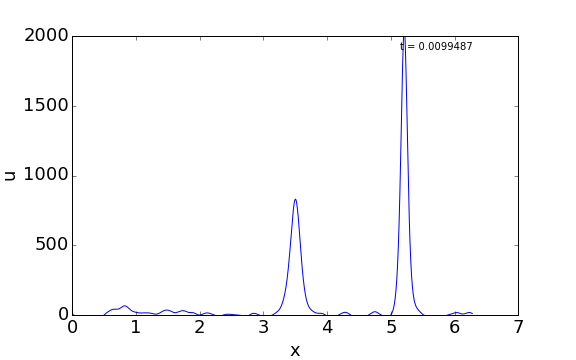
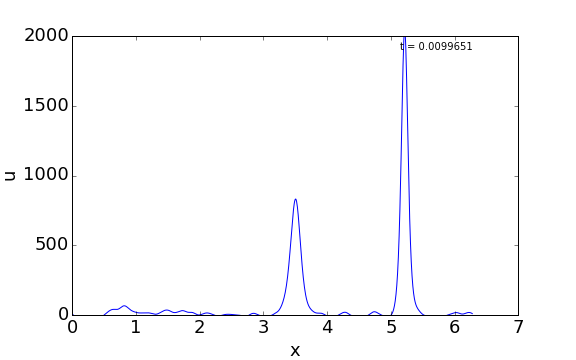
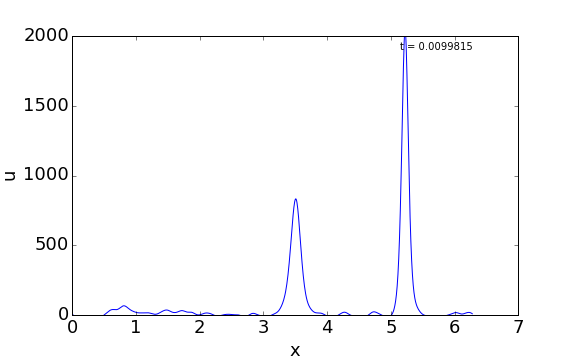
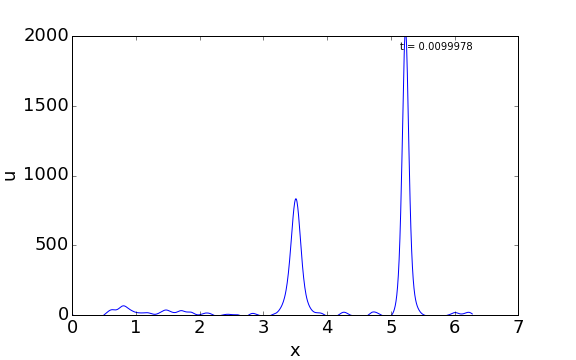

In [161]:
fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
p1, = ax.plot(x,u0)
t1 = ax.text(5.15,1900, "t = 0" )

ax.set_xlabel("x")
ax.set_ylabel("u")

def animate(n):
    p1.set_data(x,usave[n,:])
    t1.set_text("t = " + str(round(t[n]*1e7)/1e7))

animation.FuncAnimation(fig, animate,frames=nsave, interval=2)